In [1]:
import sys
sys.path.append('../')

In [2]:
from pycode.dataset import Softargmax_dataset, Softargmax_dataset_VP, Softargmax_dataset_test, RLBench_dataset3, RLBench_dataset_skip, RLBench_dataset_grasp
from pycode.config import _C as cfg
from torch.utils.data import DataLoader

import torch
import torchvision
from pycode.misc import make_rotation_image

kornia requires version >= 3.6. your version 3.6


In [3]:
# get cfg data
cfg.merge_from_file("../configs/RLBench_MP.yaml")

In [4]:
cfg

CfgNode({'GOAL_INPUT': False, 'STEP': 1, 'PRED_LEN': 1, 'PAST_LEN': 1, 'SKIP_LEN': 0, 'BASIC': CfgNode({'DEVICE': 'cuda', 'OUTPUT_DIR': '../output', 'SEED': 123, 'MAX_EPOCH': 100000, 'MAX_ITER': 150000, 'BATCH_SIZE': 4, 'NUM_GPU': 1, 'WORKERS': 4}), 'DATASET': CfgNode({'NAME': 'RLBench4', 'RGB_AUGMENTATION': True, 'DEPTH_AUGMENTATION': False, 'HMD': CfgNode({'PATH': '/misc/dl00/tendon/project/Imitation_Learning/MotionPrediction/dataset/HMD', 'ACTION_CLASS': 'summary', 'TARGET_KEY': [], 'FRAME_INTERVAL': 3, 'RANDOM_LEN': 2}), 'RLBENCH': CfgNode({'TASK_LIST': ['StackBlocks'], 'PATH': '/misc/dl00/tendon/project/Imitation_Learning/MotionPrediction/dataset/RLBench', 'PATH2': '/misc/dl00/tendon/project/Imitation_Learning/MotionPrediction/dataset/RLBench2', 'PATH3': '/misc/dl00/tendon/project/Imitation_Learning/MotionPrediction/dataset/RLBench3', 'PATH4': '/misc/dl00/tendon/project/Imitation_Learning/MotionPrediction/dataset/RLBench4', 'PATH4_SAWYER': '/misc/dl00/tendon/project/Imitation_Lear

In [38]:
train_dataset = RLBench_dataset_grasp(cfg,save_dataset=False, mode='val', num_sequence=100)
train_dataloader = DataLoader(train_dataset, batch_size=5, shuffle=False, num_workers=0)

length of future is 1 frame
load json data
json_path: /misc/dl00/tendon/project/Imitation_Learning/MotionPrediction/dataset/RLBench4/val/json/RLBench4_val_1_StackBlocks_grasp.json


In [70]:
for i, inputs in enumerate(train_dataloader):
    if i % 1000 == 0:
        print(i)
        print(data)
    break

0
{'pred_len': tensor([1]), 'index_list': [tensor([28891]), tensor([28951]), tensor([29056])], 'rgb': tensor([[[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           ...,
           [0.7882, 0.8157, 0.8039,  ..., 0.8039, 0.8000, 0.8000],
           [0.8196, 0.8157, 0.8000,  ..., 0.7804, 0.7765, 0.7725],
           [0.8471, 0.8039, 0.7882,  ..., 0.7961, 0.8196, 0.8392]],

          [[0.2549, 0.2353, 0.2118,  ..., 0.2314, 0.2353, 0.2353],
           [0.2549, 0.2353, 0.2118,  ..., 0.2314, 0.2314, 0.2314],
           [0.2549, 0.2275, 0.2157,  ..., 0.2314, 0.2314, 0.2314],
           ...,
           [0.6078, 0.6588, 0.6353,  ..., 0.6706, 0.6510, 0.6667],
           [0.6431, 0.6549, 0.6353,  ..., 0.6196, 0.6196, 0.6078],
           [0.7020, 0.6353, 0.6196,  ..., 0.6431, 0.6902, 0.6980]],

          [[0.2667, 0.2510, 0.2353,  ..., 0.2471, 0.2471, 

In [71]:
rotation_gt_image = make_rotation_image(inputs['rgb'][:,1:2], inputs['rotation_matrix'][:,2:], inputs['pose_xyz'][:,2:], inputs['mtx'])

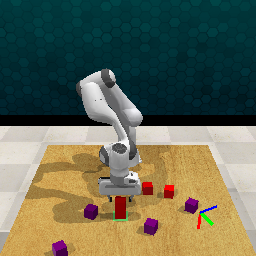

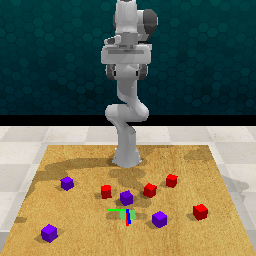

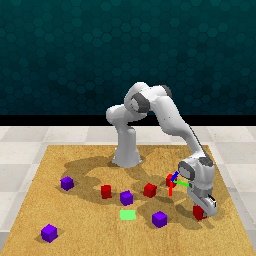

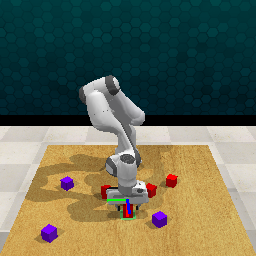

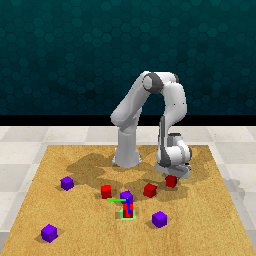

In [76]:
for i in range(5):
    display(torchvision.transforms.ToPILImage()(rotation_gt_image[i,0]))

In [27]:
inputs = train_dataset[0]

for key in inputs:
    if type(inputs[key]) == torch.Tensor:
        inputs[key] = torch.unsqueeze(inputs[key], 0)

rotation_gt_image = make_rotation_image(inputs['rgb'][:,1:2], inputs['rotation_matrix'][:,2:], inputs['pose_xyz'][:,2:], inputs['mtx'])

display(torchvision.transforms.ToPILImage()(rotation_gt_image[0,0]))

{'pred_len': 1, 'index_list': [0, 0, 77], 'rgb': tensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.7882, 0.8157, 0.8039,  ..., 0.8039, 0.8000, 0.8000],
          [0.8196, 0.8157, 0.8000,  ..., 0.7804, 0.7765, 0.7725],
          [0.8471, 0.8039, 0.7882,  ..., 0.7961, 0.8196, 0.8392]],

         [[0.2549, 0.2353, 0.2118,  ..., 0.2314, 0.2353, 0.2353],
          [0.2549, 0.2353, 0.2118,  ..., 0.2314, 0.2314, 0.2314],
          [0.2549, 0.2275, 0.2157,  ..., 0.2314, 0.2314, 0.2314],
          ...,
          [0.6078, 0.6588, 0.6353,  ..., 0.6706, 0.6510, 0.6667],
          [0.6431, 0.6549, 0.6353,  ..., 0.6196, 0.6196, 0.6078],
          [0.7020, 0.6353, 0.6196,  ..., 0.6431, 0.6902, 0.6980]],

         [[0.2667, 0.2510, 0.2353,  ..., 0.2471, 0.2471, 0.2471],
          [0.2627, 0.2510, 0.2353,  ..., 0.2471, 0.2471, 0.

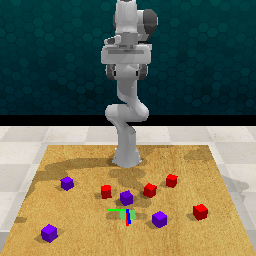

In [35]:
inputs = train_dataset[1]

for key in inputs:
    if type(inputs[key]) == torch.Tensor:
        inputs[key] = torch.unsqueeze(inputs[key], 0)

rotation_gt_image = make_rotation_image(inputs['rgb'][:,1:2], inputs['rotation_matrix'][:,2:], inputs['pose_xyz'][:,2:], inputs['mtx'])

display(torchvision.transforms.ToPILImage()(rotation_gt_image[0,0]))

In [36]:
inputs

{'pred_len': 1,
 'index_list': [0, 0, 207],
 'rgb': tensor([[[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
            [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
            [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
            ...,
            [0.7882, 0.8157, 0.8039,  ..., 0.8039, 0.8000, 0.8000],
            [0.8196, 0.8157, 0.8000,  ..., 0.7804, 0.7765, 0.7725],
            [0.8471, 0.8039, 0.7882,  ..., 0.7961, 0.8196, 0.8392]],
 
           [[0.2549, 0.2353, 0.2118,  ..., 0.2314, 0.2353, 0.2353],
            [0.2549, 0.2353, 0.2118,  ..., 0.2314, 0.2314, 0.2314],
            [0.2549, 0.2275, 0.2157,  ..., 0.2314, 0.2314, 0.2314],
            ...,
            [0.6078, 0.6588, 0.6353,  ..., 0.6706, 0.6510, 0.6667],
            [0.6431, 0.6549, 0.6353,  ..., 0.6196, 0.6196, 0.6078],
            [0.7020, 0.6353, 0.6196,  ..., 0.6431, 0.6902, 0.6980]],
 
           [[0.2667, 0.2510, 0.2353,  ..., 0.2471, 0.2471, 0.2471],
            [0.2627, 0.25

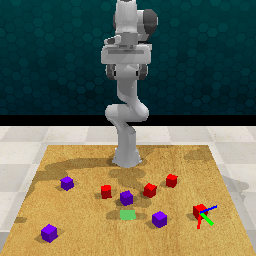

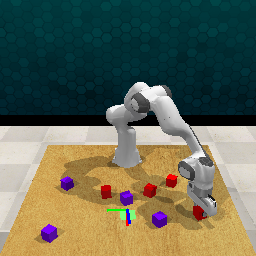

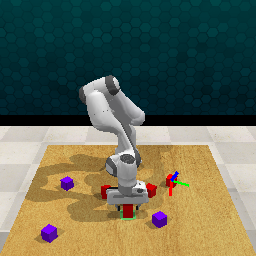

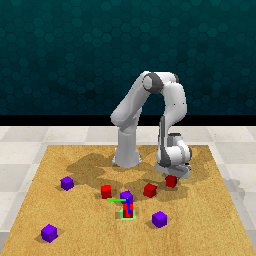

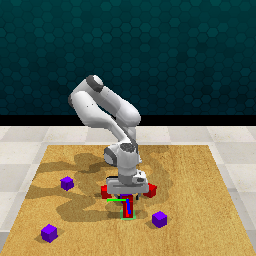

...

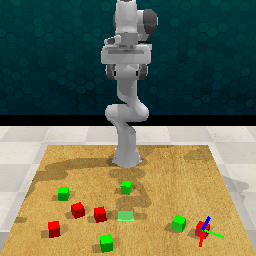

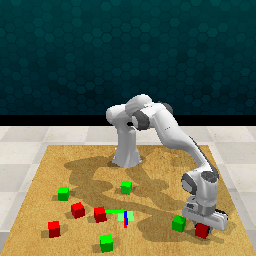

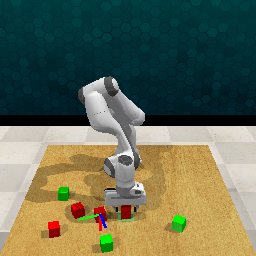

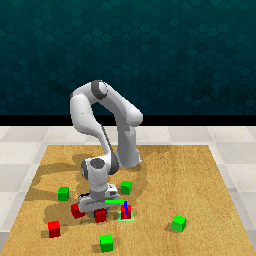

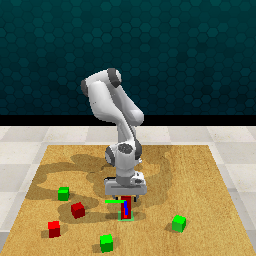

In [39]:
for i in range(100):
    inputs = train_dataset[i]

    for key in inputs:
        if type(inputs[key]) == torch.Tensor:
            inputs[key] = torch.unsqueeze(inputs[key], 0)

    rotation_gt_image = make_rotation_image(inputs['rgb'][:,1:2], inputs['rotation_matrix'][:,2:], inputs['pose_xyz'][:,2:], inputs['mtx'])

    display(torchvision.transforms.ToPILImage()(rotation_gt_image[0,0]))

In [79]:
train_dataset.data_list[0]

{'image_dir': '/misc/dl00/tendon/project/Imitation_Learning/MotionPrediction/dataset/RLBench4/val/StackBlocks/00000/image',
 'filename': '00000000',
 'pickle_path': '/misc/dl00/tendon/project/Imitation_Learning/MotionPrediction/dataset/RLBench4/val/StackBlocks/00000/base_data/00000000.pickle',
 'start_index': 0,
 'end_index': 514,
 'current_index': 0}

In [37]:
import sys, importlib
importlib.reload(sys.modules['pycode.dataset'])
from pycode.dataset import RLBench_dataset_grasp

kornia requires version >= 3.6. your version 3.6
